# Comparing different Neural Networks

Each Network uses a vector of the eigen-eigen parts and the eigenvalues and computes the rest-eigen contribution

In [110]:
using LmaPredict, Flux, Statistics, Plots, Random, StatsBase, JLD2, PrettyTables, CSV, Tables, LaTeXStrings, Dates, Measures

## Reading the data

In [2]:
const path_config = "/Users/lukasgeyer/Studium/Computational Sciences/Masterarbeit/Daten Simon/dat"
const path_plot = "../plots"

"../plots"

In [3]:
fname = readdir(path_config)[2:5001]
idx = sortperm( parse.(Int64, fname))
fname = fname[idx]
em_n = "VV"

cnfgarr = Vector{LMAConfig}(undef, 0)
for f in fname
    push!(cnfgarr, get_LMAConfig(joinpath(path_config, f), "g5-g5", em=em_n, bc=false))
end

## Splitting data in training and test sets

In [35]:
TSRC = "24"
TVALS = length(cnfgarr[1].data["rr"][TSRC]) - 1
NCNFG = length(cnfgarr)

n_times = 5
n_configs_k_folds = [(500, 5),(500, 4),(500, 2)]
isolated_testset_size = NCNFG - maximum([x[1] for x in n_configs_k_folds])
training_setups = length(n_configs_k_folds)

percentages_bc = [0.0, 0.01, 0.02, 0.05, 0.1, 0.2]

rr_data_train = []
ee_data_train = []
re_data_train = []

rr_data_test = []
ee_data_test = []
re_data_test = []

rr_data_isolatedtest = Array{Float64}(undef, TVALS, isolated_testset_size)
ee_data_isolatedtest = Array{Float64}(undef, TVALS, isolated_testset_size)
re_data_isolatedtest = Array{Float64}(undef, TVALS, isolated_testset_size)

for (n_configs, k_fold) in n_configs_k_folds
    train_size = Int(n_configs / k_fold)
    test_size = n_configs - train_size

    Random.seed!(10)
    available_config_indices = sort(sample([x for x in 1:NCNFG], n_configs, replace=false))
    available_configs = getindex(getfield.(cnfgarr, :data), available_config_indices)

    if (n_configs, k_fold) == n_configs_k_folds[end]
        indexes_isolated_testset = setdiff([indx for indx in 1:NCNFG], deepcopy(available_config_indices))
        isolated_testset = getindex(getfield.(cnfgarr, :data), indexes_isolated_testset)
        
        for (k, dd) in enumerate(isolated_testset)
    
            rr_data_isolatedtest[:,k] = getindex(getindex(dd, "rr"), TSRC)[2:end]
            
            re_data_isolatedtest[:,k] = getindex(getindex(dd, "re"), TSRC)[2:end]
        
            ee_all_TSRC = Matrix{Float64}(undef, TVALS, TVALS)
            for ee_TSRC in 0:TVALS-1
                ee_all_TSRC[:,ee_TSRC+1] = getindex(getindex(dd, "ee"), "$ee_TSRC")[2:end]
            end
    
            ee_data_isolatedtest[:,k] = mean(ee_all_TSRC, dims=2)
        end
    end

    rr_data_train_curr_setup = [[Array{Float64}(undef, TVALS, train_size) for j in 1:k_fold] for i in 1:n_times]
    ee_data_train_curr_setup = [[Array{Float64}(undef, TVALS, train_size) for j in 1:k_fold] for i in 1:n_times]
    re_data_train_curr_setup = [[Array{Float64}(undef, TVALS, train_size) for j in 1:k_fold] for i in 1:n_times]

    rr_data_test_curr_setup = [[Array{Float64}(undef, TVALS, test_size) for j in 1:k_fold] for i in 1:n_times]
    ee_data_test_curr_setup = [[Array{Float64}(undef, TVALS, test_size) for j in 1:k_fold] for i in 1:n_times]
    re_data_test_curr_setup = [[Array{Float64}(undef, TVALS, test_size) for j in 1:k_fold] for i in 1:n_times]

        
    for j in 1:n_times
        remaining_indexes_CV = deepcopy(available_config_indices)
        k_folds_indices = [Array{Int32}(undef, train_size) for k in 1:k_fold]

        for k in 1:k_fold
            Random.seed!(j+k)
            sampled_indices = sort!(sample(remaining_indexes_CV, train_size, replace=false))
            k_folds_indices[k] = sampled_indices
            remaining_indexes_CV = filter!(i -> i ∉ sampled_indices, remaining_indexes_CV)
        end
    
        for i in 1:k_fold
            indexes_train = k_folds_indices[i]
            indexes_test = setdiff(deepcopy(available_config_indices), indexes_train)
            
            training_set = getindex(getfield.(cnfgarr, :data), indexes_train)
            test_set = getindex(getfield.(cnfgarr, :data), indexes_test)
            
        
            for (k, dd) in enumerate(training_set)
                
                rr_data_train_curr_setup[j][i][:,k] = getindex(getindex(dd, "rr"), TSRC)[2:end]
        
                re_data_train_curr_setup[j][i][:,k] = getindex(getindex(dd, "re"), TSRC)[2:end]
            
                ee_all_TSRC = Matrix{Float64}(undef, TVALS, TVALS)
                for ee_TSRC in 0:TVALS-1
                    ee_all_TSRC[:,ee_TSRC+1] = getindex(getindex(dd, "ee"), "$ee_TSRC")[2:end]
                end
        
                ee_data_train_curr_setup[j][i][:,k] = mean(ee_all_TSRC, dims=2)
            end
            
            for (k, dd) in enumerate(test_set)
        
                rr_data_test_curr_setup[j][i][:,k] = getindex(getindex(dd, "rr"), TSRC)[2:end]
                
                re_data_test_curr_setup[j][i][:,k] = getindex(getindex(dd, "re"), TSRC)[2:end]
            
                ee_all_TSRC = Matrix{Float64}(undef, TVALS, TVALS)
                for ee_TSRC in 0:TVALS-1
                    ee_all_TSRC[:,ee_TSRC+1] = getindex(getindex(dd, "ee"), "$ee_TSRC")[2:end]
                end
        
                ee_data_test_curr_setup[j][i][:,k] = mean(ee_all_TSRC, dims=2)
            end
        end
    end

    push!(rr_data_train, rr_data_train_curr_setup)
    push!(ee_data_train, ee_data_train_curr_setup)
    push!(re_data_train, re_data_train_curr_setup)
    
    push!(rr_data_test, rr_data_test_curr_setup)
    push!(ee_data_test, ee_data_test_curr_setup)
    push!(re_data_test, re_data_test_curr_setup)
end

## Defining training and test data

In [37]:
input_length = 2*TVALS
output_length = TVALS

input_shape_train = []
output_shape_train = []

input_shape_test = []
output_shape_test = []

input_shape_validation = []

for (i, (_, k_fold)) in enumerate(n_configs_k_folds)
    push!(input_shape_train, [[vcat(ee_data_train[i][n][k], rr_data_train[i][n][k]) for k in 1:k_fold] for n in 1:n_times])
    push!(output_shape_train, [[re_data_train[i][n][k] for k in 1:k_fold] for n in 1:n_times])

    push!(input_shape_test, [[vcat(ee_data_test[i][n][k], rr_data_test[i][n][k]) for k in 1:k_fold] for n in 1:n_times])
    push!(output_shape_test, [[re_data_test[i][n][k] for k in 1:k_fold] for n in 1:n_times])

    push!(input_shape_validation, [[vcat(ee_data_isolatedtest, rr_data_isolatedtest) for k in 1:k_fold] for n in 1:n_times])
end

output_shape_validation = re_data_isolatedtest;

### Input

In [38]:
input_data_train_standardized = []
input_data_test_standardized = []
input_data_validation_standardized = []

for (i, (_, k_fold)) in enumerate(n_configs_k_folds)
    input_data_train_standardized_curr_setup = [[similar(input_shape_train[i][1][1]) for k in 1:k_fold] for n in 1:n_times]
    input_data_test_standardized_curr_setup = [[similar(input_shape_test[i][1][1]) for k in 1:k_fold] for n in 1:n_times] 
    input_data_validation_standardized_curr_setup = [[similar(input_shape_validation[i][1][1]) for k in 1:k_fold] for n in 1:n_times] 
    
    for n in 1:n_times
        for k in 1:k_fold
            mean_input_train = mean(input_shape_train[i][n][k], dims=ndims(input_shape_train[i][n][k]))
            std_input_train = std(input_shape_train[i][n][k], dims=ndims(input_shape_train[i][n][k]))
            
            input_data_train_standardized_curr_setup[n][k] = (input_shape_train[i][n][k] .- mean_input_train) ./ std_input_train
            input_data_test_standardized_curr_setup[n][k] = (input_shape_test[i][n][k] .- mean_input_train) ./ std_input_train
            input_data_validation_standardized_curr_setup[n][k] = (input_shape_validation[i][n][k] .- mean_input_train) ./ std_input_train
        end
    end

    push!(input_data_train_standardized, input_data_train_standardized_curr_setup)
    push!(input_data_test_standardized, input_data_test_standardized_curr_setup)
    push!(input_data_validation_standardized, input_data_validation_standardized_curr_setup)
end

### Output

In [39]:
output_data_train_standardized = []

for (i, (_, k_fold)) in enumerate(n_configs_k_folds)
    output_data_train_standardized_curr_setup = [[similar(output_shape_train[i][1][1]) for k in 1:k_fold] for n in 1:n_times] 
    
    for n in 1:n_times
        for k in 1:k_fold
            mean_output_train = mean(output_shape_train[i][n][k], dims=ndims(output_shape_train[i][n][k]))
            std_output_train = std(output_shape_train[i][n][k], dims=ndims(output_shape_train[i][n][k]))
            
            output_data_train_standardized_curr_setup[n][k] = (output_shape_train[i][n][k] .- mean_output_train) ./ std_output_train
        end
    end
    
    push!(output_data_train_standardized, output_data_train_standardized_curr_setup)
end

# Recomputing previous combination matrix

In [40]:
activation_functions = [NNlib.tanh, NNlib.celu, NNlib.elu, NNlib.tanhshrink]

models = []

for activation_function in activation_functions
    push!(models,
        [
    Chain(
    Dense(input_length => output_length, identity),
    ),
    Chain(
    Dense(input_length => 1, activation_function),
    Dense(1 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 50, activation_function),
    Dense(50 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 100, activation_function),
    Dense(100 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 400, activation_function),
    Dropout(0.8),
    Dense(400 => output_length, identity)
    ),
    Chain(
    Dense(input_length => 600, activation_function),
    Dropout(0.8),
    Dense(600 => output_length, identity)
    ),
    Chain(
    Dense(input_length => 800, activation_function),
    Dropout(0.8),
    Dense(800 => output_length, identity)
    ),
    Chain(
    Dense(input_length => 1000, activation_function),
    Dropout(0.8),
    Dense(1000 => output_length, identity)
    ),
    Chain(
    Dense(input_length => 1200, activation_function),
    Dropout(0.8),
    Dense(1200 => output_length, identity)
    ),
    Chain(
    Dense(input_length => 50, activation_function),
    Dense(50 => 1, activation_function),
    Dense(1 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 50, activation_function),
    Dense(50 => 50, activation_function),
    Dense(50 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 100, activation_function),
    Dense(100 => 50, activation_function),
    Dense(50 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 100, activation_function),
    Dense(100 => 100, activation_function),
    Dense(100 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 400, activation_function),
    Dropout(0.8),
    Dense(400 => 200, activation_function),
    Dropout(0.8),
    Dense(200 => output_length, identity)
    ),
    Chain(
    Dense(input_length => 600, activation_function),
    Dropout(0.8),
    Dense(600 => 400, activation_function),
    Dropout(0.8),
    Dense(400 => output_length, identity)
    ),
    Chain(
    Dense(input_length => 800, activation_function),
    Dropout(0.8),
    Dense(800 => 600, activation_function),
    Dropout(0.8),
    Dense(600 => output_length, identity)
    ),
    Chain(
    Dense(input_length => 1000, activation_function),
    Dropout(0.8),
    Dense(1000 => 800, activation_function),
    Dropout(0.8),
    Dense(800 => output_length, identity)
    ),
    Chain(
    Dense(input_length => 50, activation_function),
    Dense(50 => 50, activation_function),
    Dense(50 => 50, activation_function),
    Dense(50 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 100, activation_function),
    Dense(100 => 100, activation_function),
    Dense(100 => 100, activation_function),
    Dense(100 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 400, activation_function),
    Dropout(0.8),
    Dense(400 => 400, activation_function),
    Dropout(0.8),
    Dense(400 => 400, activation_function),
    Dropout(0.8),
    Dense(400 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 600, activation_function),
    Dropout(0.8),
    Dense(600 => 600, activation_function),
    Dropout(0.8),
    Dense(600 => 600, activation_function),
    Dropout(0.8),
    Dense(600 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 800, activation_function),
    Dropout(0.8),
    Dense(800 => 800, activation_function),
    Dropout(0.8),
    Dense(800 => 800, activation_function),
    Dropout(0.8),
    Dense(800 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 1000, activation_function),
    Dropout(0.8),
    Dense(1000 => 1000, activation_function),
    Dropout(0.8),
    Dense(1000 => 1000, activation_function),
    Dropout(0.8),
    Dense(1000 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 400, activation_function),
    Dropout(0.8),
    Dense(400 => 200, activation_function),
    Dropout(0.8),
    Dense(200 => 200, activation_function),
    Dropout(0.8),
    Dense(200 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 600, activation_function),
    Dropout(0.8),
    Dense(600 => 400, activation_function),
    Dropout(0.8),
    Dense(400 => 400, activation_function),
    Dropout(0.8),
    Dense(400 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 800, activation_function),
    Dropout(0.8),
    Dense(800 => 600, activation_function),
    Dropout(0.8),
    Dense(600 => 600, activation_function),
    Dropout(0.8),
    Dense(600 => output_length, identity),
    ),
    Chain(
    Dense(input_length => 1000, activation_function),
    Dropout(0.8),
    Dense(1000 => 800, activation_function),
    Dropout(0.8),
    Dense(800 => 800, activation_function),
    Dropout(0.8),
    Dense(800 => output_length, identity),
    ),
     ])
end

models = vcat(models...) |> f64

learning_rates = [1e-3]

optimizers = []
push!(optimizers,[Flux.AdaGrad(), Flux.AdaDelta(), Flux.AMSGrad(), Flux.NAdam()])
for learning_rate in learning_rates
    push!(optimizers,
        [
            Flux.Adam(learning_rate),
            Flux.RAdam(learning_rate),
            Flux.AdaMax(learning_rate),
            Flux.AdamW(learning_rate),
            Flux.OAdam(learning_rate)
            ])
end
optimizers = vcat(optimizers...)

function loss_mse(flux_model, x, y)
    batch_size = size(x)[2]
    ŷ = flux_model(x)
    
    return Flux.mse(ŷ, y, agg=sum)
end

function loss_mae(flux_model, x, y)
    batch_size = size(x)[2]
    ŷ = flux_model(x)
    
    return Flux.mae(ŷ, y, agg=sum)
end

function loss_mse_sum(flux_model, x, y)
    batch_size = size(x)[2]
    ŷ = flux_model(x)
    
    return Flux.mse(ŷ, y, agg=sum) + sum(abs.((sum.([ŷ[:,i] for i in 1:batch_size]) - sum.([y[:,i] for i in 1:batch_size]))))
end

loss_functions = [loss_mse, loss_mae, loss_mse_sum]
epochs = [150]
batch_sizes = [64]
variables = ["Model", "Optimizer", "Loss function", "Epoch", "Batch size"];

n_combinations = length(models) * length(loss_functions) * length(epochs) * length(batch_sizes) * length(optimizers)
combinations_matrix = Matrix{Any}(undef, n_combinations, length(variables))

index = 1
for model in models
    for optimizer in optimizers
        for loss_function in loss_functions
            for epoch in epochs
                for batch_size in batch_sizes
                    combinations_matrix[index,:] = [model, optimizer, loss_function, epoch, batch_size]
                    index +=1
                end
            end
        end
    end
end

## Describing parameter regions - choose the best models from previous grid search

In [9]:
curr_date = now()

output_directory = "/Users/lukasgeyer/Studium/Computational Sciences/Masterarbeit/Tool Allesandro/repo/LmaPredict/results/gridSearch/ee+ev/"

previous_results_matrix_name = output_directory * "results_2024-04-13.csv"

combination_matrix_name = output_directory * "models_$curr_date.csv";

In [177]:
scores_mat_previous = CSV.File(open(previous_results_matrix_name); header=1, types=Float64) |> CSV.Tables.matrix

combinations_matrix_prev_best = [combinations_matrix[i,:] for i in  Int.(scores_mat_previous[(scores_mat_previous[:,3] .> -2),:][:,1])]
n_combinations_prev_best = size(combinations_matrix_prev_best)[1]

#combinations_matrix = permutedims(hcat(combinations_matrix_prev_best...)) |> gpu
combinations_matrix = permutedims(hcat(combinations_matrix_prev_best...))
n_combinations = n_combinations_prev_best

#CSV.write(combination_matrix_name, Tables.table(combinations_matrix), header=variables, delim=";", decimal=',')

1056

# Perfoming Grid-Search

In [11]:
scores_table_beforeBC_header = [
    "Index",
    "Min(max. R-Score)",
    "<max. R-Score>",
    "Std(max. R-Score)",
    "<(epoch of max R-Score>",
    "Std(epoch of max R-Score)",
    "Min(max. R-Score (Val. set))",
    "<max. R-Score (Val. set)>",
    "Std(max. R-Score (Val. set))",
    "<epoch of max R-Score (Val. set)>",
    "Std(epoch of max R-Score (Val. set))",
]

scores_table_afterBC_header = vcat(
    [
    "Index",
    "<epoch of min <Chi²>>",
    "Std(<epoch of min Chi²>)",
    vcat(hcat([hcat(["<Chi²($p%)>"]...) for p in Int.(percentages_bc * 100)]...)...),
    vcat(hcat([hcat(["<Chi_configs²($p%)>"]...) for p in Int.(percentages_bc * 100)]...)...)
    ]
    ...)

scores_mat_before_BC = Matrix{Float64}(undef, n_combinations_prev_best, length(scores_table_beforeBC_header))
scores_mat_after_BC = Matrix{Float64}(undef, n_combinations_prev_best, length(scores_table_afterBC_header));

In [160]:
function applyBC(out_of_sample_predictions, model, j, n, k, train_size, test_size)
    
    χ²_model = Array{Float32}(undef, length(percentages_bc))
    χ²_configs = Array{Float32}(undef, length(percentages_bc))
    for (p, percentage) in enumerate(percentages_bc)

        if percentage > 0 
            Δc = 1 / percentage
            configs = Int.(ceil.([x for x in 1:Δc:test_size]))
        else
            configs = []
        end
        n_configs = length(configs)
        
        uncorr_target_configs = stack(deleteat!([output_shape_test[j][n][k][:,i] for i in 1:test_size],configs), dims=2)
            
        mean_target = mean(uncorr_target_configs, dims=2)
        σ_mean_target = std(uncorr_target_configs, dims=2) ./ sqrt(test_size - n_configs - 1)
    
        mean_target_train = mean(output_shape_train[j][n][k], dims=2)
        σ_mean_target_train = std(output_shape_train[j][n][k], dims=2) ./ sqrt(train_size - 1)
                
        mean_predicted = mean(out_of_sample_predictions, dims=2) 
        σ_predicted = std(out_of_sample_predictions, dims=2) ./ sqrt(test_size - 1)
            
        if percentage > 0
            bias_correction = mean(hcat([[out_of_sample_predictions[:,i] - output_shape_test[j][n][k][:,i] for i in configs][i] for i in 1:length(configs)]...), dims=2)
            σ_bc = std(hcat([[out_of_sample_predictions[:,i] - output_shape_test[j][n][k][:,i] for i in configs][i] for i in 1:length(configs)]...), dims=2) ./ sqrt(n_configs - 1)
                
            mean_target_train = mean(hcat(output_shape_train[j][n][k], hcat([output_shape_test[j][n][k][:,i] for i in configs]...)), dims=2)
            σ_mean_target_train = std(hcat(output_shape_train[j][n][k], hcat([output_shape_test[j][n][k][:,i] for i in configs]...)), dims=2) ./ sqrt(train_size + n_configs - 1)
        else
            bias_correction = zeros(output_length) 
            σ_bc = zeros(output_length)
        end

        mean_predicted = mean_predicted - bias_correction
        σ_pred_bc = σ_predicted + σ_bc
            
        χ²_model[p] = sum(((mean_predicted - mean_target) ./ sqrt.(σ_pred_bc.^2 + σ_mean_target.^2)).^2)
        χ²_configs[p] = sum(((mean_target_train - mean_target) ./ sqrt.(σ_mean_target_train.^2 + σ_mean_target.^2)).^2)
    end

    return (χ²_model, χ²_configs)
end

applyBC (generic function with 1 method)

In [181]:
for (j, (n_configs, k_fold)) in enumerate(n_configs_k_folds)
        println("$n_configs" * " configs available and doing CV with " * "$k_fold" * "-fold:")
        
        train_size = Int(n_configs / k_fold)
        test_size = n_configs - train_size
    
        outputn = n_configs
        outputk = k_fold
    
        results_matrix_name_beforeBC = output_directory * "results_beforeBC_" * "$n_configs" * "_" * "$k_fold" * "_$curr_date.csv"
        results_matrix_name_afterBC = output_directory * "results_afterBC_" * "$n_configs" * "_" * "$k_fold" * "_$curr_date.csv"
        
        for i in 173:n_combinations
            model = combinations_matrix[i,1]
            optimizer = combinations_matrix[i,2]
            loss_function = combinations_matrix[i,3]
            epochs = combinations_matrix[i,4]
        
            initial_params = deepcopy(Flux.params(model))
        
            max_R = Array{Float32}(undef, k_fold*n_times)
            epoch_of_max_R = Array{Float32}(undef, k_fold*n_times)
            max_R_val = Array{Float32}(undef, k_fold*n_times)
            epoch_of_max_R_val = Array{Float32}(undef, k_fold*n_times)
            
            epoch_of_min_χ² = Array{Float32}(undef, k_fold*n_times)
            min_χ²_values_model = Array{Float32}(undef, k_fold*n_times, length(percentages_bc))
            min_χ²_values_computedconfigs = Array{Float32}(undef, k_fold*n_times, length(percentages_bc))
            
            index = 1
            for n in 1:n_times
                for k in 1:k_fold
                    mean_train = repeat(mean.([output_shape_train[j][n][k][i,:] for i in 1:output_length]), 1, test_size)
                    mean_train_val = repeat(mean.([output_shape_train[j][n][k][i,:] for i in 1:output_length]), 1, isolated_testset_size)
                    
                    mean_output_train = mean(output_shape_train[j][n][k], dims=ndims(output_shape_train[j][n][k]))
                    std_output_train = std(output_shape_train[j][n][k], dims=ndims(output_shape_train[j][n][k]))
                    
                    Random.seed!(20)
                    loader = Flux.DataLoader(
                                        (input_data_train_standardized[j][n][k], output_data_train_standardized[j][n][k]),
                                        batchsize=batch_size,
                                        shuffle=true)
                
                    optim = Flux.setup(optimizer, model)
                
                    R_scores = zeros(epochs)
                    R_scores_val = zeros(epochs)
                    χ²_scores_model = zeros(epochs, length(percentages_bc))
                    χ²_scores_computedconfigs = zeros(epochs, length(percentages_bc))
                    
                    function training()
                        for e in 1:epochs
                            for (x,y) in loader
                                grads = gradient(m -> loss_function(m, x, y), model)
                                Flux.update!(optim, model, grads[1])
                            end
                            out_of_sample_predictions = (model(input_data_test_standardized[j][n][k]) .* std_output_train) .+ mean_output_train
                            validation_set_predictions = (model(input_data_validation_standardized[j][n][k]) .* std_output_train) .+ mean_output_train
                            
                            R_scores_val[e] = 1 - (Flux.mse(validation_set_predictions, output_shape_validation, agg=sum) / Flux.mse(mean_train_val, output_shape_validation, agg=sum))
                            R_scores[e] = 1 - (Flux.mse(out_of_sample_predictions, output_shape_test[j][n][k], agg=sum) / Flux.mse(mean_train, output_shape_test[j][n][k], agg=sum))
    
                            (χ²_scores_model[e,:], χ²_scores_computedconfigs[e,:]) = applyBC(out_of_sample_predictions, model, j, n, k, train_size, test_size)
                        end
                    end
                
                    training()
        
                    max_R_val[index] = maximum(R_scores_val)
                    epoch_of_max_R_val[index] = argmax(R_scores_val)
                    max_R[index] = maximum(R_scores)
                    epoch_of_max_R[index] = argmax(R_scores)
    
                    avrg_χ²_scores_model = mean(χ²_scores_model, dims=2)
    
                    epoch_of_min_χ²[index] = argmin(avrg_χ²_scores_model)[1]
                    min_χ²_values_model[index,:] = χ²_scores_model[argmin(avrg_χ²_scores_model)[1], :]
                    min_χ²_values_computedconfigs[index,:] = χ²_scores_computedconfigs[argmin(avrg_χ²_scores_model)[1], :]
                    
                    Flux.loadparams!(model,initial_params)
                    
                    index += 1
                end
            end
            
            scores_mat_before_BC[i,:] = [
                i,
                minimum(max_R),
                mean(max_R),
                std(max_R),
                mean(epoch_of_max_R),
                std(epoch_of_max_R),
                minimum(max_R_val),
                mean(max_R_val),
                std(max_R_val),
                mean(epoch_of_max_R_val),
                std(epoch_of_max_R_val)
            ]
    
            scores_mat_after_BC[i,:] = vcat([
                i,
                mean(epoch_of_min_χ²),
                std(epoch_of_min_χ²),
                vcat(mean(min_χ²_values_model, dims=1)...),
                vcat(mean(min_χ²_values_computedconfigs, dims=1)...)
            ]...)    
        
            println("$i/$n_combinations done...")
            CSV.write(results_matrix_name_beforeBC, Tables.table(scores_mat_before_BC), header=scores_table_beforeBC_header, delim=";")
            CSV.write(results_matrix_name_afterBC, Tables.table(scores_mat_after_BC), header=scores_table_afterBC_header, delim=";")
        end
    end
    println("done.")
end

LoadError: InvalidIRError: compiling MethodInstance for (::Metal.var"#broadcast_2d#203")(::MtlDeviceMatrix{Float32, 1}, ::Base.Broadcast.Broadcasted{Metal.MtlArrayStyle{2, Private}, Tuple{Base.OneTo{Int64}, Base.OneTo{Int64}}, typeof(*), Tuple{Base.Broadcast.Broadcasted{Metal.MtlArrayStyle{2, Private}, Nothing, typeof(*), Tuple{Base.Broadcast.Broadcasted{Metal.MtlArrayStyle{2, Private}, Nothing, typeof(>), Tuple{Base.Broadcast.Extruded{MtlDeviceMatrix{Float32, 1}, Tuple{Bool, Bool}, Tuple{Int64, Int64}}, Float64}}, Float32}}, Base.Broadcast.Extruded{MtlDeviceMatrix{Float32, 1}, Tuple{Bool, Bool}, Tuple{Int64, Int64}}}}) resulted in invalid LLVM IR
[31mReason: unsupported use of double value[39m
[31mReason: unsupported use of double value[39m
Stacktrace:
  [1] [0m[1mFloat64[22m
[90m    @[39m [90m./[39m[90m[4mfloat.jl:261[24m[39m
  [2] [0m[1mconvert[22m
[90m    @[39m [90m./[39m[90m[4mnumber.jl:7[24m[39m
  [3] [0m[1m_promote[22m
[90m    @[39m [90m./[39m[90m[4mpromotion.jl:370[24m[39m
  [4] [0m[1mpromote[22m
[90m    @[39m [90m./[39m[90m[4mpromotion.jl:393[24m[39m
  [5] [0m[1m<[22m
[90m    @[39m [90m./[39m[90m[4mpromotion.jl:462[24m[39m
  [6] [0m[1m>[22m
[90m    @[39m [90m./[39m[90m[4moperators.jl:378[24m[39m
  [7] [0m[1m_broadcast_getindex_evalf[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:709[24m[39m
  [8] [0m[1m_broadcast_getindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:682[24m[39m
  [9] [0m[1m_getindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:705[24m[39m
 [10] [0m[1m_broadcast_getindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:681[24m[39m
 [11] [0m[1m_getindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:705[24m[39m
 [12] [0m[1m_broadcast_getindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:681[24m[39m
 [13] [0m[1mgetindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:636[24m[39m
 [14] [0m[1mbroadcast_2d[22m
[90m    @[39m [90m~/.julia/packages/Metal/q9oGt/src/[39m[90m[4mbroadcast.jl:105[24m[39m
[31mReason: unsupported use of double value[39m
Stacktrace:
  [1] [0m[1m<[22m
[90m    @[39m [90m./[39m[90m[4mfloat.jl:536[24m[39m
  [2] [0m[1m<[22m
[90m    @[39m [90m./[39m[90m[4mpromotion.jl:462[24m[39m
  [3] [0m[1m>[22m
[90m    @[39m [90m./[39m[90m[4moperators.jl:378[24m[39m
  [4] [0m[1m_broadcast_getindex_evalf[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:709[24m[39m
  [5] [0m[1m_broadcast_getindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:682[24m[39m
  [6] [0m[1m_getindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:705[24m[39m
  [7] [0m[1m_broadcast_getindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:681[24m[39m
  [8] [0m[1m_getindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:705[24m[39m
  [9] [0m[1m_broadcast_getindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:681[24m[39m
 [10] [0m[1mgetindex[22m
[90m    @[39m [90m./[39m[90m[4mbroadcast.jl:636[24m[39m
 [11] [0m[1mbroadcast_2d[22m
[90m    @[39m [90m~/.julia/packages/Metal/q9oGt/src/[39m[90m[4mbroadcast.jl:105[24m[39m
[36m[1mHint[22m[39m[36m: catch this exception as `err` and call `code_typed(err; interactive = true)` to introspect the erronous code with Cthulhu.jl[39m

# Evaluating results

In [179]:
results_mat_beforeBC_name = output_directory * "results_beforeBC_500_5_2024-04-26.csv"

scores_mat_beforeBC = CSV.File(open(results_mat_beforeBC_name); header=1, types=Float64) |> CSV.Tables.matrix

1056×11 Matrix{Float64}:
    1.0   0.149281    0.198161   …    0.0130206    63.32  44.2406
    2.0   0.142197    0.193117        0.0125348    58.48  38.2972
    3.0   0.156612    0.199428        0.0128408    55.96  37.262
    4.0   0.0201456   0.028791        0.00471485  150.0    0.0
    5.0   0.00610205  0.0264675       0.00623211  150.0    0.0
    6.0   0.0092389   0.0314888  …    0.0098254   150.0    0.0
    7.0   0.145051    0.173367        0.00821228  147.88  10.6
    8.0   0.119739    0.161657        0.00986192  146.44  10.817
    9.0   0.144263    0.174831        0.00936624  147.12   8.79545
   10.0   0.0671161   0.0732843       0.00381793  150.0    0.0
   11.0   0.0279696   0.066001   …    0.00813586  150.0    0.0
   12.0   0.0502247   0.063096        0.00545194  150.0    0.0
   13.0   0.0629782   0.0704839       0.00406209  150.0    0.0
    ⋮                            ⋱                         ⋮
 1045.0   0.183608    0.219531       10.5438      139.64  10.547
 1046.0   0.1624

In [194]:
results_mat_afterBC_name = output_directory * "results_afterBC_500_5_2024-04-26.csv"

scores_mat_afterBC = CSV.File(open(results_mat_afterBC_name); header=1, types=Float64) |> CSV.Tables.matrix;

1056×15 Matrix{Float64}:
    1.0   84.32  51.8304  130.79    …  35.5085  40.2323  36.9068  37.167
    2.0   93.12  56.4678  178.503      35.5085  40.2323  36.9068  37.167
    3.0   63.36  46.5885  129.675      35.5085  40.2323  36.9068  37.167
    4.0   77.76  70.9914  178.216      35.5085  40.2323  36.9068  37.167
    5.0   51.12  58.6468  171.063      35.5085  40.2323  36.9068  37.167
    6.0   69.28  67.2771  176.344   …  35.5085  40.2323  36.9068  37.167
    7.0   90.04  65.3188  154.345      35.5085  40.2323  36.9068  37.167
    8.0   39.2   61.3657  171.027      35.5085  40.2323  36.9068  37.167
    9.0   87.16  61.6419  149.04       35.5085  40.2323  36.9068  37.167
   10.0   97.48  65.3109  172.943      35.5085  40.2323  36.9068  37.167
   11.0   34.0   49.1816  169.85    …  35.5085  40.2323  36.9068  37.167
   12.0   73.44  63.7319  171.128      35.5085  40.2323  36.9068  37.167
   13.0   98.28  64.8007  173.161      35.5085  40.2323  36.9068  37.167
    ⋮                     

In [181]:
function getParams(model::Chain)
    params = 0
    for layer in model
        params += sum(length, Flux.params(layer); init=0.0)
    end

    return params
end

getParams (generic function with 1 method)

In [204]:
params = map(model -> getParams(model), combinations_matrix[:,1])

params_score = hcat(params, scores_mat_beforeBC)
params_χ² = hcat(params, scores_mat_afterBC);

# Visualizing R-Score results

In [282]:
params_maxR_absSmallerTen = params_score[(abs.(params_score[:,4]) .< 10),:]
params_maxR_biggerZero = params_score[(params_score[:,4] .> 0),:]
params_maxR_bigger03 = params_score[(params_score[:,4] .> 0.3),:]

xlabel = L"parameters \ to \ train"
ylabel = L"\mathbb{E}(max(R))"

scatter(
    thickness_scaling=1.5,
    dpi=400,
    params_maxR_absSmallerTen[:,1],
    params_maxR_absSmallerTen[:,4],
    size=(1200,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5,
    label=""
)
xlabel!(xlabel)
ylabel!(ylabel)

savefig("gridSearch2_500-5_results.png")

"/Users/lukasgeyer/Studium/Computational Sciences/Masterarbeit/Tool Allesandro/repo/LmaPredict/notebooks/gridSearch2_500-5_results.png"

In [284]:
scatter(
    thickness_scaling=1.5,
    dpi=400,
    params_maxR_biggerZero[:,1],
    params_maxR_biggerZero[:,4],
    size=(1200,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    label=:false,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5
)

xlabel!(xlabel)
ylabel!(ylabel)

savefig("gridSearch2_500-5_results_zoomed.png")

"/Users/lukasgeyer/Studium/Computational Sciences/Masterarbeit/Tool Allesandro/repo/LmaPredict/notebooks/gridSearch2_500-5_results_zoomed.png"

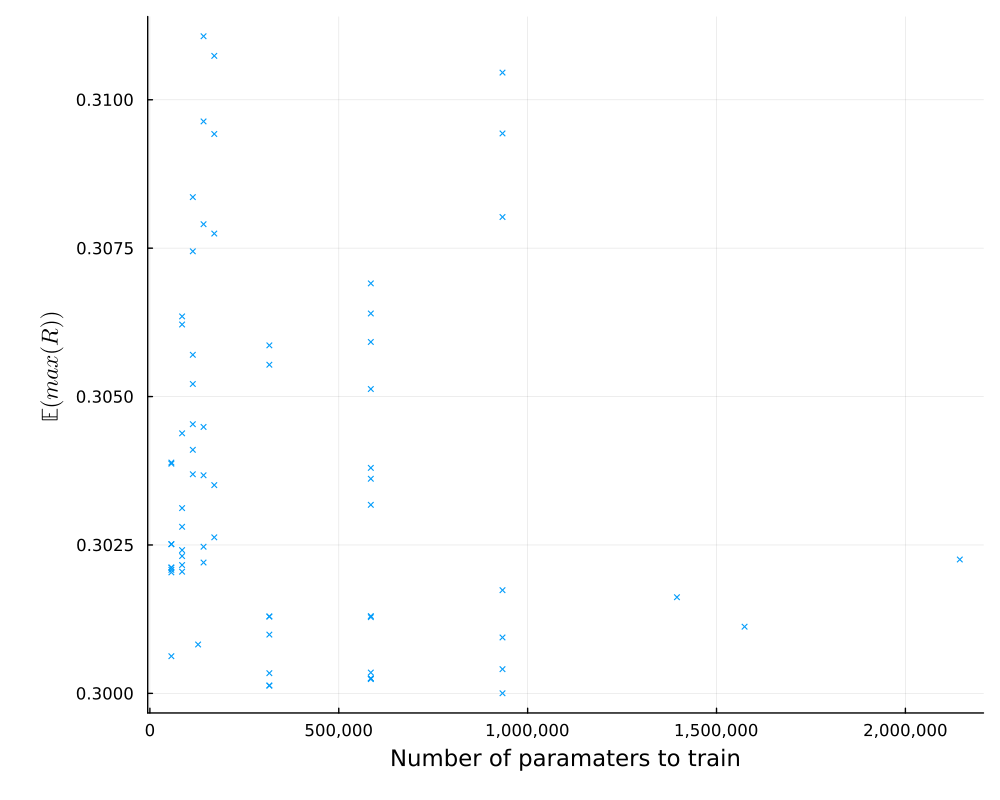

In [167]:
scatter(
    thickness_scaling=1.4,
    params_maxR_bigger03[:,1],
    params_maxR_bigger03[:,4],
    size=(1000,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    label=:false,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5
)
scatter!(
    thickness_scaling=1.4,
    params_maxR_bigger03_val[:,1],
    params_maxR_bigger03_val[:,4],
    size=(1000,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    label=:false,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5
)

xlabel!(xlabel)
ylabel!(ylabel)

#savefig("gridSearch.png")

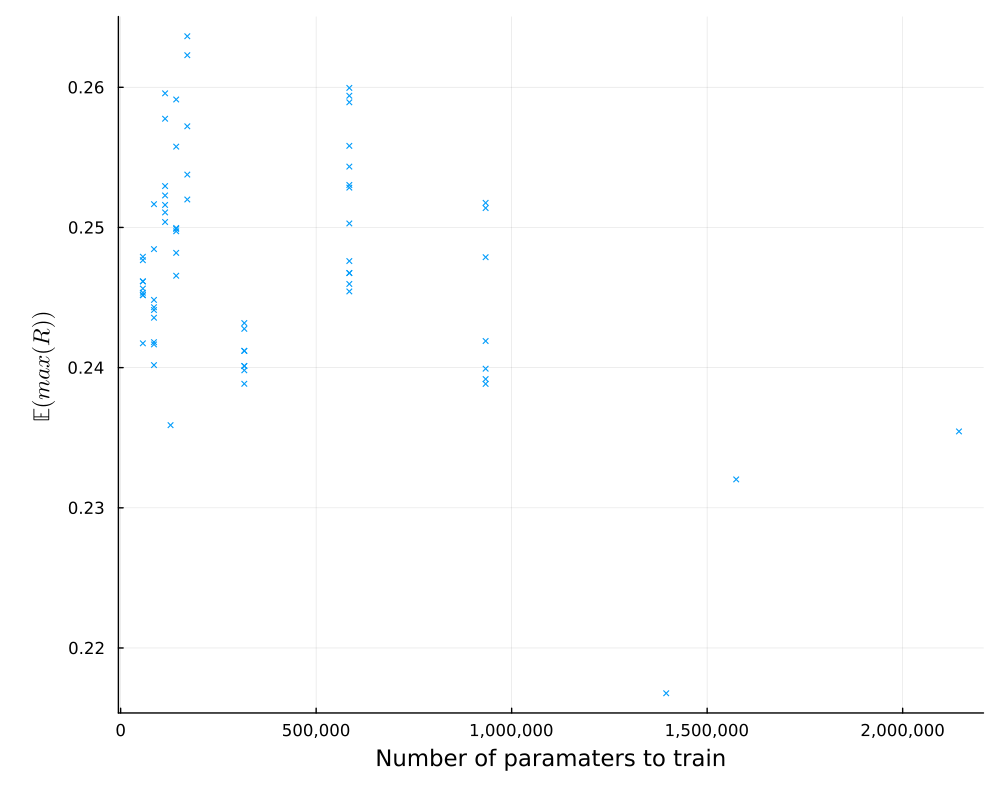

In [157]:
scatter(
    thickness_scaling=1.4,
    params_maxR_bigger03[:,1],
    params_maxR_bigger03[:,8],
    size=(1000,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    label=:false,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5
)
xlabel!(xlabel)
ylabel!(ylabel)

#savefig("gridSearch.png")

# Visualizing $\chi^2$ results

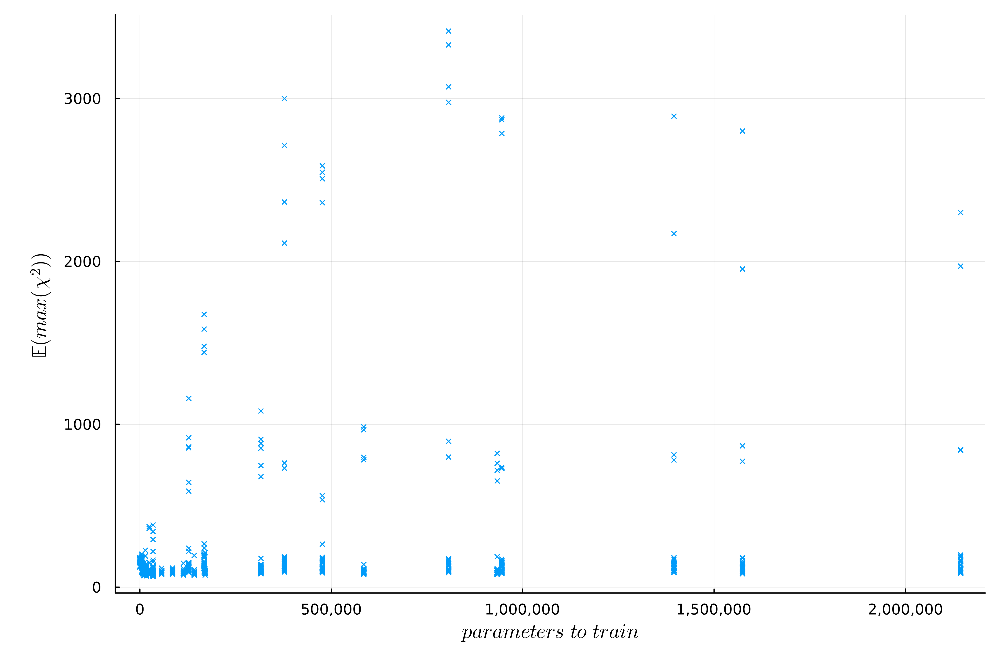

In [231]:
params_maxχ²_smallerOneFiftfy = params_χ²[(params_χ²[:,5] .< 150),:]
params_maxχ²_BC1percent_smallerOneFiftfy = params_χ²[(params_χ²[:,6] .< 150),:]

xlabel = L"parameters \ to \ train"
ylabel = L"\mathbb{E}(max(\chi^2))"

scatter(
    thickness_scaling=1.5,
    dpi=400,
    params_χ²[:,1],
    params_χ²[:,5],
    size=(1200,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    label=:false,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5
)

xlabel!(xlabel)
ylabel!(ylabel)

#savefig("gridSearch2_500-5_chi_results.png")

<Chi²(0%)>


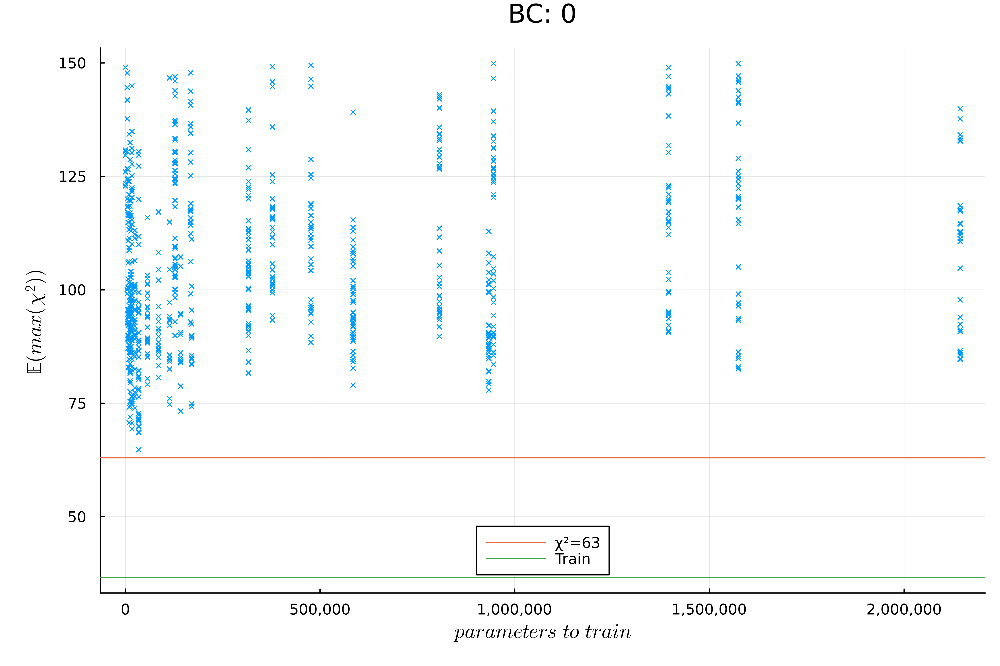

In [256]:
i = 5
println(scores_table_afterBC_header[i-1])

bc = Int(test_size * percentages_bc[i-4])
plot_title = "BC: $bc"

p1 = scatter(
    thickness_scaling=1.5,
    dpi=400,
    params_maxχ²_smallerOneFiftfy[:,1],
    params_maxχ²_smallerOneFiftfy[:,i],
    size=(1200,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    label=:false,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5,
    title=plot_title,
    legend=:bottom
)
hline!([63],label="χ²=63")
hline!([params_maxχ²_smallerOneFiftfy[1,i+length(percentages_bc)]],label="Train")

xlabel!(xlabel)
ylabel!(ylabel)

#savefig("gridSearch2_500-5_results.png")

<Chi²(1%)>


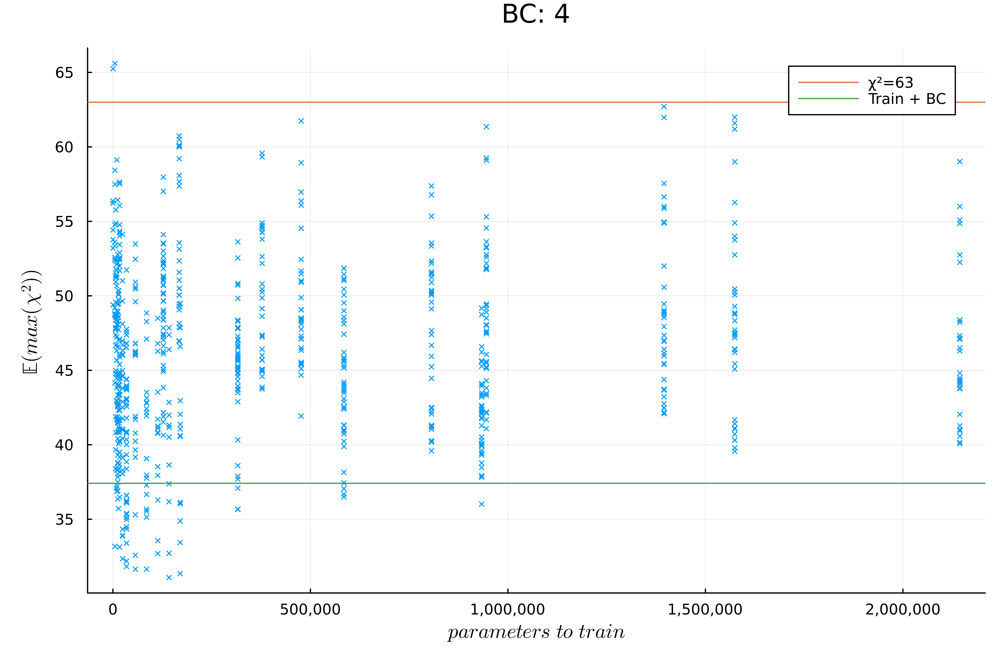

In [265]:
i = 6
println(scores_table_afterBC_header[i-1])

bc = Int(test_size * percentages_bc[i-4])
plot_title = "BC: $bc"

p2 = scatter(
    thickness_scaling=1.5,
    dpi=400,
    params_maxχ²_smallerOneFiftfy[:,1],
    params_maxχ²_smallerOneFiftfy[:,i],
    size=(1200,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    label=:false,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5,
    title=plot_title,
    legend=:topright
)
hline!([63],label="χ²=63")
hline!([params_maxχ²_smallerOneFiftfy[1,i+length(percentages_bc)]],label="Train + BC")

xlabel!(xlabel)
ylabel!(ylabel)

#savefig("gridSearch2_500-5_results.png")

<Chi²(2%)>


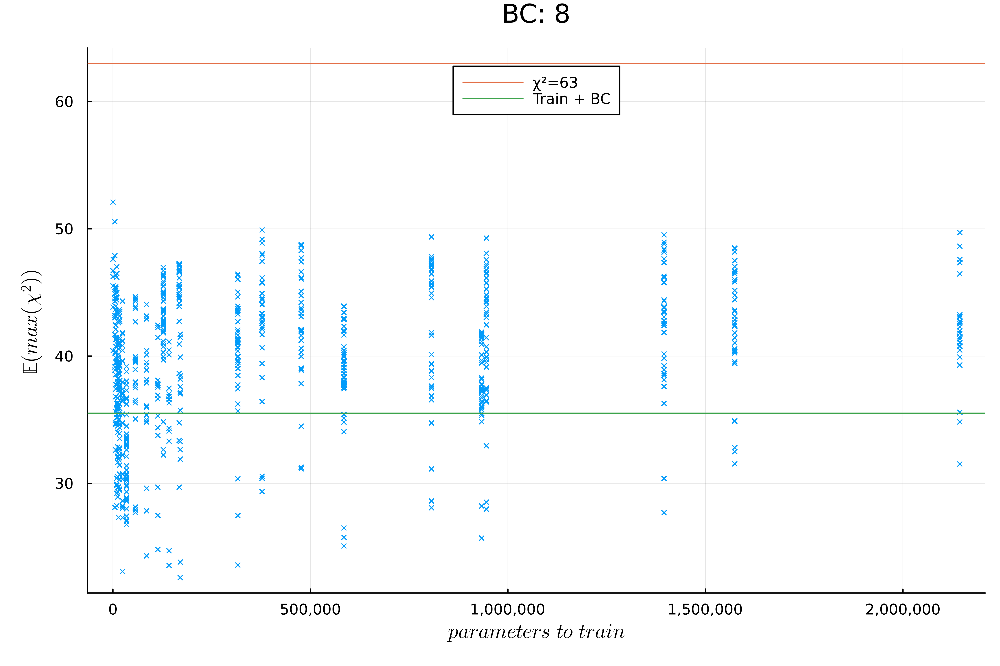

In [260]:
i = 7 
println(scores_table_afterBC_header[i-1])

bc = Int(test_size * percentages_bc[i-4])
plot_title = "BC: $bc"

p3 = scatter(
    thickness_scaling=1.5,
    dpi=400,
    params_maxχ²_smallerOneFiftfy[:,1],
    params_maxχ²_smallerOneFiftfy[:,i],
    size=(1200,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    label=:false,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5,
    title=plot_title,
    legend=:top
)
hline!([63],label="χ²=63")
hline!([params_maxχ²_smallerOneFiftfy[1,i+length(percentages_bc)]],label="Train + BC")

xlabel!(xlabel)
ylabel!(ylabel)

#savefig("gridSearch2_500-5_results.png")

<Chi²(5%)>


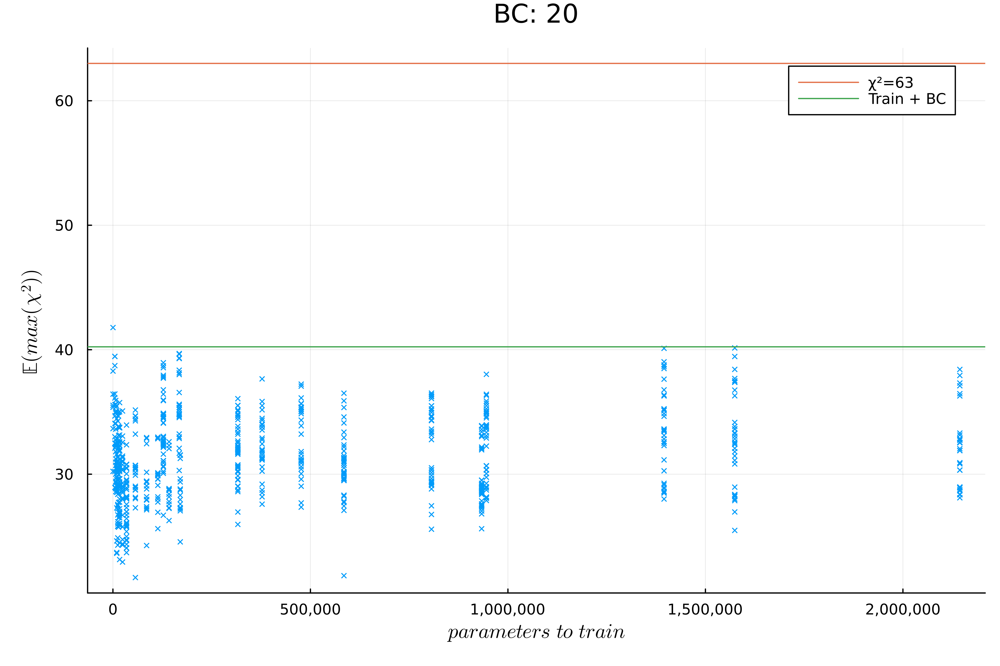

In [248]:
i = 8
println(scores_table_afterBC_header[i-1])

bc = Int(test_size * percentages_bc[i-4])
plot_title = "BC: $bc"

p4 = scatter(
    thickness_scaling=1.5,
    dpi=400,
    params_maxχ²_smallerOneFiftfy[:,1],
    params_maxχ²_smallerOneFiftfy[:,i],
    size=(1200,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    label=:false,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5,
    title=plot_title
)
hline!([63],label="χ²=63")
hline!([params_maxχ²_smallerOneFiftfy[1,i+length(percentages_bc)]],label="Train + BC")

xlabel!(xlabel)
ylabel!(ylabel)

#savefig("gridSearch2_500-5_results.png")

<Chi²(10%)>


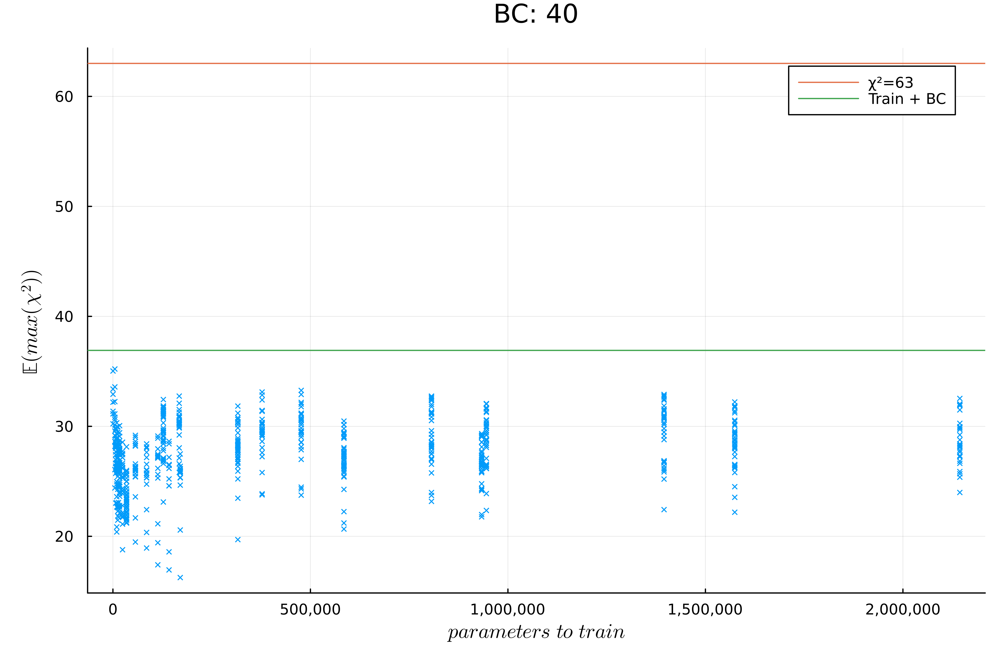

In [250]:
i = 9
println(scores_table_afterBC_header[i-1])

bc = Int(test_size * percentages_bc[i-4])
plot_title = "BC: $bc"

p5 = scatter(
    thickness_scaling=1.5,
    dpi=400,
    params_maxχ²_smallerOneFiftfy[:,1],
    params_maxχ²_smallerOneFiftfy[:,i],
    size=(1200,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    label=:false,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5,
    title=plot_title
)
hline!([63],label="χ²=63")
hline!([params_maxχ²_smallerOneFiftfy[1,i+length(percentages_bc)]],label="Train + BC")

xlabel!(xlabel)
ylabel!(ylabel)

#savefig("gridSearch2_500-5_results.png")

<Chi²(20%)>


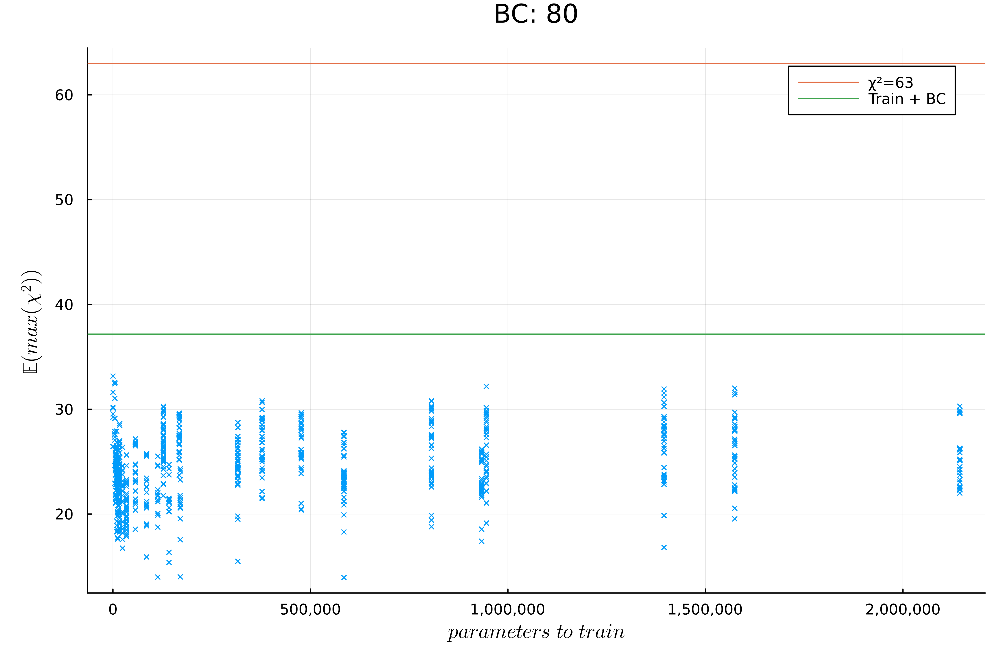

In [251]:
i = 10
println(scores_table_afterBC_header[i-1])

bc = Int(test_size * percentages_bc[i-4])
plot_title = "BC: $bc"

p6 = scatter(
    thickness_scaling=1.5,
    dpi=400,
    params_maxχ²_smallerOneFiftfy[:,1],
    params_maxχ²_smallerOneFiftfy[:,i],
    size=(1200,800),
    xticks=([0,500_000,1_000_000,1_500_000,2_000_000],["0", "500,000", "1,000,000","1,500,000","2,000,000"]),
    label=:false,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.5,
    title=plot_title
)
hline!([63],label="χ²=63")
hline!([params_maxχ²_smallerOneFiftfy[1,i+length(percentages_bc)]],label="Train + BC")

xlabel!(xlabel)
ylabel!(ylabel)

#savefig("gridSearch2_500-5_results.png")

In [279]:
l = @layout [a b c; d e f]

p1 = plot!(p1,xlabel="",xticks=false)
p2 = plot!(p2,xlabel="",ylabel="",xticks=false)
p3 = plot!(p3,xlabel="",ylabel="",xticks=false)
p4 = plot!(p4,xticks=([i for i in 0:1_000_000:2_000_000],["0","1,000,000","2,000,000"]))
p5 = plot!(p5,ylabel="",xticks=([i for i in 0:1_000_000:2_000_000],["0","1,000,000","2,000,000"]))
p6 = plot!(p6,ylabel="",xticks=([i for i in 0:1_000_000:2_000_000],["0","1,000,000","2,000,000"]))

p = plot(
        p1,p2,p3,p4,p5,p6,
        layout = l,
        size=(1200,800),
        dpi = 400,
        thickness_scaling = 1.5,
        left_margin=5mm,
        linewidth=1.0,
        yticks=[i for i in 0:50:150],
        ylims=(0,150)
    )

savefig("gridSearch2_500-5_results_BCChi.png")

"/Users/lukasgeyer/Studium/Computational Sciences/Masterarbeit/Tool Allesandro/repo/LmaPredict/notebooks/gridSearch2_500-5_results_BCChi.png"

# Test suite

In [86]:
R_biggerZero = scores_mat_beforeBC[(scores_mat_beforeBC[:,2] .> 0),:]
max_R = R_biggerZero[(R_biggerZero[:,2] .≈ maximum(R_biggerZero[:,2])), :]

1×11 Matrix{Float64}:
 159.0  0.289979  0.31074  0.0118799  75.2  …  0.00947336  77.44  11.4458

In [138]:
loss_function = loss_mse
optimizer = NAdam(0.001)

NAdam(0.001, (0.9, 0.999), 1.0e-8, IdDict{Any, Any}())

In [87]:
index = 159

optimizer = combinations_matrix[index,2]
loss_function = combinations_matrix[index,3]
epochs = combinations_matrix[index, 4]
#batch_size = combinations_matrix[index, 5]
batch_size = 100

model = combinations_matrix[index,1] 

Chain(
  Dense(94 => 600, tanh),               # 57_000 parameters
  Dropout(0.8),
  Dense(600 => 47),                     # 28_247 parameters
)                   # Total: 4 arrays, 85_247 parameters, 666.273 KiB.

In [139]:
model = Chain(
  Dense(94 => 400, tanh),               # 38_000 parameters
  Dropout(0.8),
  Dense(400 => 47),                     # 18_847 parameters
)

model = model |> f64

Chain(
  Dense(94 => 400, tanh),               # 38_000 parameters
  Dropout(0.8),
  Dense(400 => 47),                     # 18_847 parameters
)                   # Total: 4 arrays, 56_847 parameters, 444.398 KiB.

In [140]:
d = 1
n = 1
k = 4

test_size = Int(n_configs_k_folds[d][1] - (n_configs_k_folds[d][1] / n_configs_k_folds[d][2]))
train_size = Int((n_configs_k_folds[d][1] / n_configs_k_folds[d][2]))

Random.seed!(20)

mean_train = repeat(mean.([output_shape_train[d][n][k][i,:] for i in 1:output_length]), 1, test_size)
mean_train_val = repeat(mean.([output_shape_train[d][n][k][i,:] for i in 1:output_length]), 1, isolated_testset_size)
mean_output_train = mean(output_shape_train[d][n][k], dims=ndims(output_shape_train[d][n][k])) 
std_output_train = std(output_shape_train[d][n][k], dims=ndims(output_shape_train[d][n][k])) 
                
Random.seed!(20)
loader = Flux.DataLoader(
    (input_data_train_standardized[d][n][k], output_data_train_standardized[d][n][k]),
    batchsize=batch_size,
    shuffle=true) 
            
optim = Flux.setup(optimizer, model)
            
R_scores = zeros(epochs)
R_scores_val = zeros(epochs)
function training()
    for e in 1:epochs
        for (x,y) in loader
            grads = gradient(m -> loss_function(m, x, y), model)
            Flux.update!(optim, model, grads[1])
        end
    out_of_sample_predictions = (model(input_data_test_standardized[d][n][k]) .* std_output_train) .+ mean_output_train 
    validation_set_predictions = (model(input_data_validation_standardized[d][n][k]) .* std_output_train) .+ mean_output_train
                        
    R_scores_val[e] = 1 - (Flux.mse(validation_set_predictions, output_shape_validation, agg=sum) / Flux.mse(mean_train_val, output_shape_validation, agg=sum))
    R_scores[e] = 1 - (Flux.mse(out_of_sample_predictions, output_shape_test[d][n][k], agg=sum) / Flux.mse(mean_train, output_shape_test[d][n][k], agg=sum))
    end
end
            
training()

out_of_sample_predictions = (model(input_data_test_standardized[d][n][k]) .* std_output_train) .+ mean_output_train;

In [141]:
argmax(R_scores)

88

In [142]:
R_scores[argmax(R_scores)]

0.3065850317961366

In [146]:
Flux.mse(mean_train, output_shape_test[d][n][k], agg=sum)

0.002546071362365434

In [147]:
Flux.mse(out_of_sample_predictions, output_shape_test[d][n][k], agg=sum)

0.0018002554077626719

In [148]:
1 - (Flux.mse(out_of_sample_predictions, output_shape_test[d][n][k], agg=sum) / Flux.mse(mean_train, output_shape_test[d][n][k], agg=sum))

0.29292814240283505

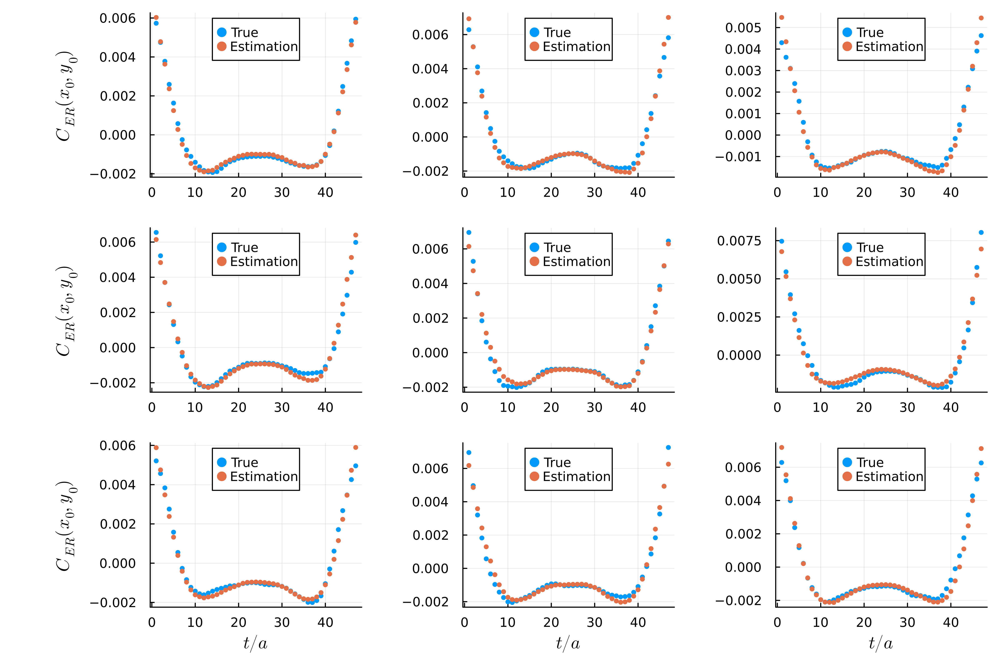

In [169]:
out_of_sample_predictions = (model(input_data_test_standardized[d][n][k]) .* std_output_train) .+ mean_output_train

l = @layout [a b c; d e f; g h i]

Random.seed!(20)
c = rand([i for i in 1:test_size], 9)

p1 = scatter(output_shape_test[d][n][k][:,c[1]], label="True")
scatter!(p1, out_of_sample_predictions[:,c[1]], label="Estimation", legend=:top,left_margin=10mm)
ylabel!(p1,L"C_{ER}(x_0,y_0)")

p2 = scatter(output_shape_test[d][n][k][:,c[2]], label="True")
scatter!(p2, out_of_sample_predictions[:,c[2]], label="Estimation", legend=:top)

p3 = scatter(output_shape_test[d][n][k][:,c[3]], label="True")
scatter!(p3, out_of_sample_predictions[:,c[3]], label="Estimation", legend=:top, )

p4 = scatter(output_shape_test[d][n][k][:,c[4]], label="True")
scatter!(p4, out_of_sample_predictions[:,c[4]], label="Estimation", legend=:top)
ylabel!(p4,L"C_{ER}(x_0,y_0)")

p5 = scatter(output_shape_test[d][n][k][:,c[5]], label="True")
scatter!(p5, out_of_sample_predictions[:,c[5]], label="Estimation", legend=:top)

p6 = scatter(output_shape_test[d][n][k][:,c[6]], label="True")
scatter!(p6, out_of_sample_predictions[:,c[6]], label="Estimation", legend=:top)

p7 = scatter(output_shape_test[d][n][k][:,c[7]], label="True")
scatter!(p7, out_of_sample_predictions[:,c[7]], label="Estimation", legend=:top)
ylabel!(p7,L"C_{ER}(x_0,y_0)")
xlabel!(p7,L"t/a")

p8 = scatter(output_shape_test[d][n][k][:,c[8]], label="True")
scatter!(p8, out_of_sample_predictions[:,c[8]], label="Estimation", legend=:top)
xlabel!(p8,L"t/a")

p9 = scatter(output_shape_test[d][n][k][:,c[9]], label="True")
scatter!(p9, out_of_sample_predictions[:,c[9]], label="Estimation", legend=:top)
xlabel!(p9,L"t/a")

plot(p1, p2, p3, p4, p5, p6, p7, p8, p9,
    layout = l,
    size=(1200,800),
    dpi=400,
    markerstrokewidth = 0,
    markersize=2.5,
    thickness_scaling=1.3
)
#savefig("bestGridSearchExamples.png")

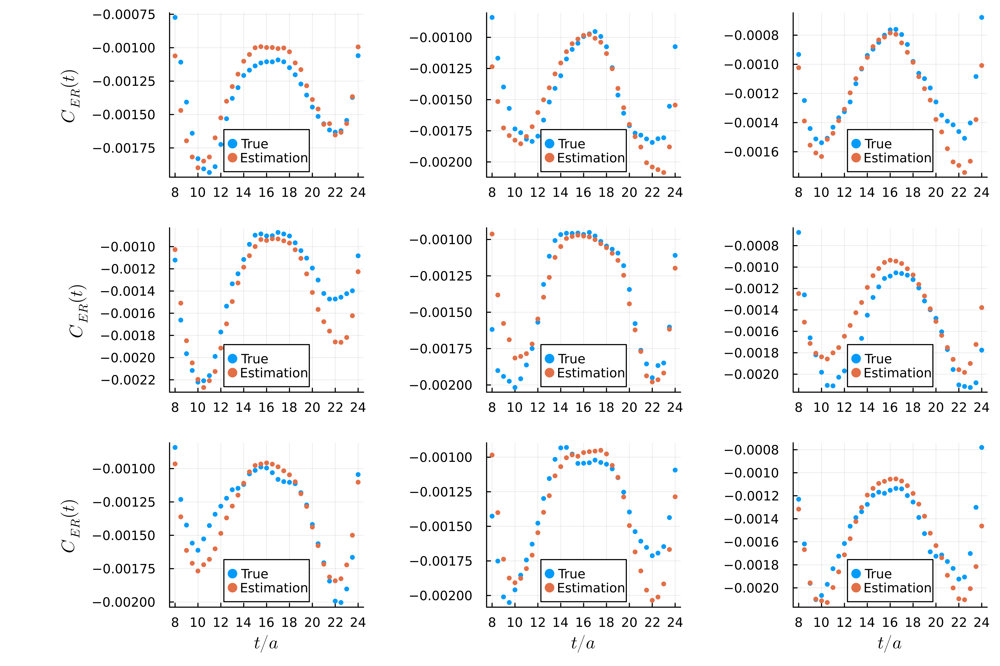

In [170]:
x_start = 8
x_end = 40

l = @layout [a b c; d e f; g h i]

Random.seed!(20)
c = rand([i for i in 1:test_size],9)

p1 = scatter(output_shape_test[d][n][k][:,c[1]][x_start:x_end], label="True")
scatter!(p1, out_of_sample_predictions[:,c[1]][x_start:x_end], label="Estimation", legend=:bottom,left_margin=10mm)
ylabel!(p1,L"C_{ER}(t)")

p2 = scatter(output_shape_test[d][n][k][:,c[2]][x_start:x_end], label="True")
scatter!(p2, out_of_sample_predictions[:,c[2]][x_start:x_end], label="Estimation", legend=:bottom)

p3 = scatter(output_shape_test[d][n][k][:,c[3]][x_start:x_end], label="True")
scatter!(p3, out_of_sample_predictions[:,c[3]][x_start:x_end], label="Estimation", legend=:bottom)

p4 = scatter(output_shape_test[d][n][k][:,c[4]][x_start:x_end], label="True")
scatter!(p4, out_of_sample_predictions[:,c[4]][x_start:x_end], label="Estimation", legend=:bottom)
ylabel!(p4,L"C_{ER}(t)")

p5 = scatter(output_shape_test[d][n][k][:,c[5]][x_start:x_end], label="True")
scatter!(p5, out_of_sample_predictions[:,c[5]][x_start:x_end], label="Estimation", legend=:bottom)

p6 = scatter(output_shape_test[d][n][k][:,c[6]][x_start:x_end], label="True")
scatter!(p6, out_of_sample_predictions[:,c[6]][x_start:x_end], label="Estimation", legend=:bottom)

p7 = scatter(output_shape_test[d][n][k][:,c[7]][x_start:x_end], label="True")
scatter!(p7, out_of_sample_predictions[:,c[7]][x_start:x_end], label="Estimation", legend=:bottom)
ylabel!(p7,L"C_{ER}(t)")
xlabel!(p7,L"t/a")

p8 = scatter(output_shape_test[d][n][k][:,c[8]][x_start:x_end], label="True")
scatter!(p8, out_of_sample_predictions[:,c[8]][x_start:x_end], label="Estimation", legend=:bottom)
xlabel!(p8,L"t/a")

p9 = scatter(output_shape_test[d][n][k][:,c[9]][x_start:x_end], label="True")
scatter!(p9, out_of_sample_predictions[:,c[9]][x_start:x_end], label="Estimation", legend=:bottom)
xlabel!(p9,L"t/a")

plot(p1, p2, p3, p4, p5, p6, p7, p8, p9,
    layout = l,
    size=(1200,800),
    dpi=400,
    markerstrokewidth = 0,
    markersize=2.5,
    xticks=([i for i in 1:4:(x_end-x_start)+1],["$i" for i in x_start:2:x_end]),
    thickness_scaling=1.3
)
#savefig("bestGridSearchExamples_zoomed.png")

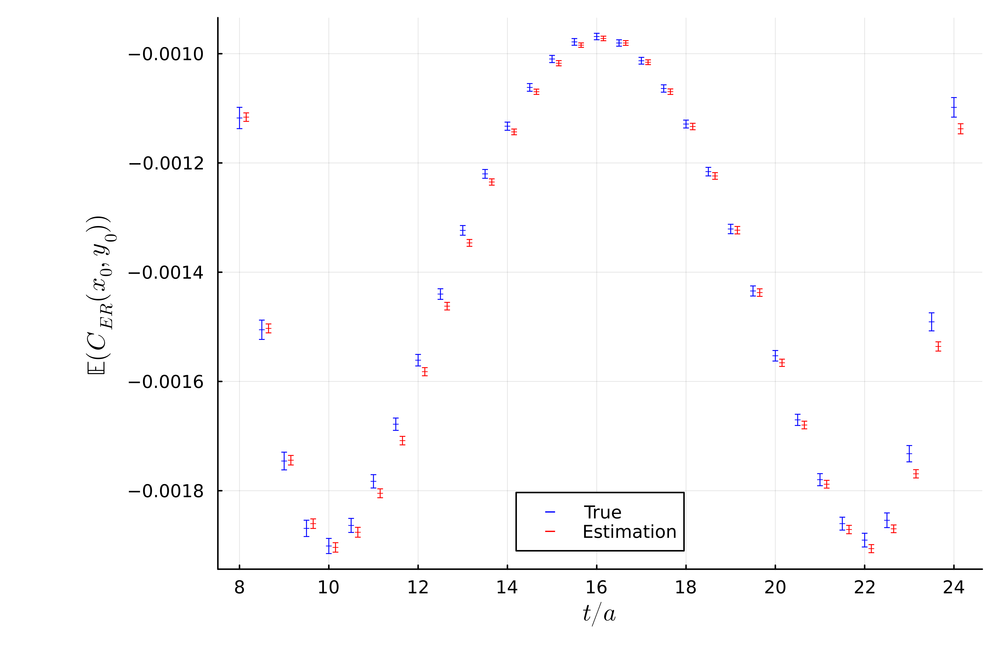

In [172]:
Δx = 0.3
x_start = 8
x_end = 40

mean_target = mean.([output_shape_test[d][n][k][i,:] for i in 1:TVALS])
σ_target = std.([output_shape_test[d][n][k][i,:] for i in 1:TVALS]) ./ sqrt(test_size - 1)
        
mean_predicted = mean.([out_of_sample_predictions[i,:] for i in 1:TVALS])
σ_predicted = std.([out_of_sample_predictions[i,:] for i in 1:TVALS]) ./ sqrt(test_size - 1)

max_Δμ = maximum(abs.((mean_target - mean_predicted) ./ mean_target))

p = scatter(
        size=(1200,800),
        dpi = 400,
        thickness_scaling = 1.8,
)
    
scatter!(p,
    mean_target[x_start:x_end],
    yerr=σ_target[x_start:x_end],
    label="True",
    legend=:bottom,
    linecolor=:blue,
    markercolor=:blue,
    marker=:hline,
    markersize = 1.9,
    markerstrokewidth = 0.3,
    linewidth=0.6

)
scatter!(p,
    [x + Δx for x in 1:x_end-x_start+1],
    mean_predicted[x_start:x_end],
    yerr=σ_predicted[x_start:x_end],
    label="Estimation",
    legend=:bottom,
    linecolor=:red,
    markercolor=:red,
    marker =:hline,
    markersize = 1.9,
    markerstrokewidth = 0.3,
    xticks=([i for i in 1:4:(x_end-x_start)+1],["$i" for i in x_start:2:x_end]),
    linewidth=0.6
)

ylabel!(p,L"\mathbb{E}(C_{ER}(x_0,y_0))")
xlabel!(p,L"t/a")
#savefig("resultAverage.png")

# Bias-Correction

### Applying bias correction on a percentage of the test data

In [ ]:
num_tests = 100
percentages = [0.0, 0.01, 0.02, 0.05, 0.1, 0.12, 0.15, 0.2]
Random.seed!(20)
seeds = rand([i for i in 1:1_000_000], num_tests)

χ²_model = Matrix{Float64}(undef, length(percentages), num_tests)
χ²_configs = Matrix{Float64}(undef, length(percentages), num_tests)
for (p,percentage) in enumerate(percentages)
    χ²_model_bc = zeros(num_tests)
    χ²_configs_bc = zeros(num_tests)
    
    i = 1
    for test in 1:num_tests
        n_configs = Int(test_size * percentage)

        Random.seed!(seeds[test])
        configs = sort!(sample([i for i in 1:test_size], n_configs, replace = false))
        
        uncorr_target_configs = stack(deleteat!([output_shape_test[n][k][:,i] for i in 1:test_size],configs), dims=2)
        
        mean_target = mean(uncorr_target_configs, dims=2)
        σ_mean_target = std(uncorr_target_configs, dims=2) ./ sqrt(test_size - n_configs - 1)

        mean_target_train = mean(output_shape_train[n][k], dims=2)
        σ_mean_target_train = std(output_shape_train[n][k], dims=2) ./ sqrt(train_size - 1)
            
        mean_predicted = mean(out_of_sample_predictions, dims=2)
        σ_predicted = std(out_of_sample_predictions, dims=2) ./ sqrt(test_size - 1)
        
        if percentage > 0
            bias_correction = mean(hcat([[out_of_sample_predictions[:,i] - output_shape_test[n][k][:,i] for i in configs][i] for i in 1:length(configs)]...), dims=2)
            σ_bc = std(hcat([[out_of_sample_predictions[:,i] - output_shape_test[n][k][:,i] for i in configs][i] for i in 1:length(configs)]...), dims=2) ./ sqrt(n_configs - 1)
            
            mean_target_train = mean(hcat(output_shape_train[n][k], hcat([output_shape_test[n][k][:,i] for i in configs]...)), dims=2)
            σ_mean_target_train = std(hcat(output_shape_train[n][k], hcat([output_shape_test[n][k][:,i] for i in configs]...)), dims=2) ./ sqrt(train_size + n_configs - 1)
        else
            bias_correction = zeros(output_length)
            σ_bc = zeros(output_length)
        end
        
        mean_predicted = mean_predicted - bias_correction
        σ_pred_bc = σ_predicted + σ_bc
        
        χ²_model_bc[i] = sum(((mean_predicted - mean_target) ./ sqrt.(σ_pred_bc.^2 + σ_mean_target.^2)).^2)
        χ²_configs_bc[i] = sum(((mean_target_train - mean_target) ./ sqrt.(σ_mean_target_train.^2 + σ_mean_target.^2)).^2)

        i += 1
    end

    χ²_model[p,:] = χ²_model_bc
    χ²_configs[p,:] = χ²_configs_bc
end     

In [ ]:
p = scatter(
    size=(1400,1000),
    dpi = 1000,
    thickness_scaling = 1.6
)

scatter!(
    p,
    percentages,
    mean(χ²_model, dims=2),
    yerr=std(χ²_model, dims=2) ./ num_tests,
    label="Model",
    inecolor=:blue,
    marker=:xcross,
    markersize = 5,
    markerstrokewidth = 0.3,
    xticks=(percentages, ["$i%" for i in Int.(percentages*100)])
)

scatter!(
    p,
    percentages,
    mean(χ²_configs, dims=2),
    yerr=std(χ²_configs, dims=2) ./ num_tests,
    label="Train + BC configs",
    inecolor=:red,
    marker=:xcross,
    markersize = 5,
    markerstrokewidth = 0.3,
    xticks=(percentages, ["$i%" for i in Int.(percentages*100)])
)


hline!(p,
    [63],
    label="Target"
)

xlabel!(p, "Percentage of total configs used for BC")
ylabel!(p, L"\chi^2")

In [ ]:
p = scatter(
    size=(1400,1000),
    dpi = 1000,
    thickness_scaling = 1.6
)

scatter!(
    p,
    percentages,
    maximum(χ²_model, dims=2),
    label="Model",
    inecolor=:blue,
    marker=:diamond,
    markersize = 5,
    markerstrokewidth = 0.3,
    xticks=(percentages, ["$i%" for i in Int.(percentages*100)])
)

scatter!(
    p,
    percentages,
    maximum(χ²_configs, dims=2),
    label="Train + BC configs",
    inecolor=:red,
    marker=:diamond,
    markersize = 5,
    markerstrokewidth = 0.3,
    xticks=(percentages, ["$i%" for i in Int.(percentages*100)])
)


hline!(p,
    [63],
    label="Target"
)

xlabel!(p, "Percentage of total configs used for BC")
ylabel!(p, L"max(\chi^2)")

In [ ]:
Δx = 0.2
x_start = 8
x_end = 40

percentage = 0.0
n_configs = Int(test_size * percentage)        
configs = sort!(sample([i for i in 1:test_size], n_configs, replace = false))
        
uncorr_target_configs = stack(deleteat!([output_shape_test[n][k][:,i] for i in 1:test_size],configs), dims=2)
        
mean_target = mean(uncorr_target_configs, dims=2)
σ_mean_target = std(uncorr_target_configs, dims=2) ./ sqrt(test_size - 1 - n_configs)

mean_target_train = mean(output_shape_train[n][k], dims=2)
σ_mean_target_train = std(output_shape_train[n][k], dims=2) ./ sqrt(train_size - 1)
            
mean_predicted = mean(out_of_sample_predictions, dims=2)
σ_predicted = std(out_of_sample_predictions, dims=2) ./ sqrt(test_size - 1)
        
if percentage > 0
    bias_correction = mean(hcat([[out_of_sample_predictions[:,i] - output_shape_test[n][k][:,i] for i in configs][i] for i in 1:length(configs)]...), dims=2)
    σ_bc = std(hcat([[out_of_sample_predictions[:,i] - output_shape_test[n][k][:,i] for i in configs][i] for i in 1:length(configs)]...), dims=2) ./ sqrt(n_configs - 1)

    mean_target_train = mean(hcat(output_shape_train[n][k], hcat([output_shape_test[n][k][:,i] for i in configs]...)), dims=2)
    σ_mean_target_train = std(hcat(output_shape_train[n][k], hcat([output_shape_test[n][k][:,i] for i in configs]...)), dims=2) ./ sqrt(train_size + n_configs - 1)
else
    bias_correction = zeros(output_length)
    σ_bc = zeros(output_length)
end
        
mean_predicted = mean_predicted - bias_correction
σ_pred_bc = σ_predicted + σ_bc

χ² = sum(((mean_predicted - mean_target) ./ sqrt.(σ_pred_bc.^2 + σ_mean_target.^2)).^2)
χ²_train = sum(((mean_target_train - mean_target) ./ sqrt.(σ_mean_target_train.^2 + σ_mean_target.^2)).^2)
println("χ² = ", χ²)
println("χ²_train = ", χ²_train)

p = scatter(
    size=(1400,1000),
    dpi = 1000,
    thickness_scaling = 1.6,
    title="bc: $n_configs"
)
    
scatter!(p,
    [x for x in 1:x_end-x_start+1],
    mean_target[x_start:x_end],
    yerr=σ_mean_target[x_start:x_end],
    label="actual",
    legend=:bottom,
    linecolor=:blue,
    marker=:xcross,
    markersize = 2,
    markerstrokewidth = 0.3,
    xticks=([i for i in 1:2:(x_end-x_start)+1],["$i" for i in x_start:2:x_end])
)

scatter!(p,
    [x + Δx for x in 1:x_end-x_start+1],
    mean_predicted[x_start:x_end],
    yerr=σ_pred_bc[x_start:x_end],
    label="predicted",
    legend=:bottom,
    linecolor=:red,
    marker =:+,
    markersize = 2,
    markerstrokewidth = 0.3,
    xticks=([i for i in 1:2:(x_end-x_start)+1],["$i" for i in x_start:2:x_end])
)

#scatter!(p,
#    [x - Δx for x in 1:x_end-x_start+1],
#    mean_target_train[x_start:x_end],
#    yerr=σ_mean_target_train[x_start:x_end],
#    label="actual (training set)",
#    legend=:bottom,
#    linecolor=:yellow,
#    marker=:xcross,
#    markersize = 2,
#    markerstrokewidth = 0.3,
#    xticks=([i for i in 1:2:(x_end-x_start)+1],["$i" for i in x_start:2:x_end])
#)

xlabel!(p,L"t/a")
ylabel!(p,L"C^{re}(x_0,y_0)")
#savefig(p,"prediction_mean_bc.png")

In [174]:
function apply_bias_correction(output_dir::String)
    Δx = 0.6
    x_start = 8
    x_end = 40

    percentages_bc = [0.0, 0.01, 0.02, 0.05, 0.1, 0.2]
    n_configs_bc = Int.(percentages_bc * test_size)

    l = @layout [a b c; d e f]

    means_target = Matrix{Float64}(undef, TVALS, length(percentages_bc))
    stds_target = Matrix{Float64}(undef, TVALS, length(percentages_bc))
    
    means_pred = Matrix{Float64}(undef, TVALS, length(percentages_bc))
    stds_pred = Matrix{Float64}(undef, TVALS, length(percentages_bc))
    
    means_diff = Matrix{Float64}(undef, TVALS, length(percentages_bc))
    
    for (p,percentage) in enumerate(percentages_bc)
        Random.seed!(10)
        n_configs = Int(test_size * percentage)

        configs = sort!(sample([i for i in 1:test_size], n_configs, replace = false))
        
        uncorr_target_configs = stack(deleteat!([output_shape_test[d][n][k][:,i] for i in 1:test_size],configs), dims=2)
        
        mean_target = mean(uncorr_target_configs, dims=2)
        σ_mean_target = std(uncorr_target_configs, dims=2) ./ sqrt(test_size - n_configs - 1)

        mean_target_train = mean(output_shape_train[d][n][k], dims=2)
        σ_mean_target_train = std(output_shape_train[d][n][k], dims=2) ./ sqrt(train_size - 1)
            
        mean_predicted = mean(out_of_sample_predictions, dims=2)
        σ_predicted = std(out_of_sample_predictions, dims=2) ./ sqrt(test_size - 1)
        
        if percentage > 0
            bias_correction = mean(hcat([[out_of_sample_predictions[:,i] - output_shape_test[d][n][k][:,i] for i in configs][i] for i in 1:length(configs)]...), dims=2)
            σ_bc = std(hcat([[out_of_sample_predictions[:,i] - output_shape_test[d][n][k][:,i] for i in configs][i] for i in 1:length(configs)]...), dims=2) ./ sqrt(n_configs - 1)
            
            mean_target_train = mean(hcat(output_shape_train[d][n][k], hcat([output_shape_test[d][n][k][:,i] for i in configs]...)), dims=2)
            σ_mean_target_train = std(hcat(output_shape_train[d][n][k], hcat([output_shape_test[d][n][k][:,i] for i in configs]...)), dims=2) ./ sqrt(train_size + n_configs - 1)
        else
            bias_correction = zeros(output_length)
            σ_bc = zeros(output_length)
        end
        
        mean_predicted = mean_predicted - bias_correction
        σ_pred_bc = σ_predicted + σ_bc
        
        means_target[:,p] = mean_target
        stds_target[:,p] = σ_mean_target
        
        means_pred[:,p] = mean_predicted
        stds_pred[:,p] = σ_pred_bc
    end

    p1 = scatter(
        [x for x in 1:x_end-x_start+1],
        means_target[x_start:x_end,1],
        yerr=stds_target[x_start:x_end,1],
        label="True",
        legend=:bottom,
        linecolor=:blue,
        markercolor=:blue,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2,
        ylabel=L"\mathbb{E}(C_{ER}(x_0,y_0))"
    )
    scatter!(
        p1,
        [x + Δx for x in 1:x_end-x_start+1],
        means_pred[x_start:x_end,1],
        yerr=stds_pred[x_start:x_end,1],
        label="Estimation",
        legend=:bottom,
        linecolor=:red,
        markercolor=:red,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2,
        xticks=([i for i in 1:2:(x_end-x_start)+1],["$i" for i in x_start:2:x_end])
    )


    p2 = scatter(
        [x for x in 1:x_end-x_start+1],
        means_target[x_start:x_end,2],
        yerr=stds_target[x_start:x_end,2],
        label="True",
        legend=:bottom,
        linecolor=:blue,
        markercolor=:blue,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2   
    )
    scatter!(
        p2,
        [x + Δx for x in 1:x_end-x_start+1],
        means_pred[x_start:x_end,2],
        yerr=stds_pred[x_start:x_end,2],
        label="Estimation",
        legend=:bottom,
        linecolor=:red,
        markercolor=:red,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2,
    )

    
    p3 = scatter(
        [x for x in 1:x_end-x_start+1],
        means_target[x_start:x_end,3],
        yerr=stds_target[x_start:x_end,3],
        label="True",
        legend=:bottom,
        linecolor=:blue,
        markercolor=:blue,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2,
    )
    scatter!(
        p3,
        [x + Δx for x in 1:x_end-x_start+1],
        means_pred[x_start:x_end,3],
        yerr=stds_pred[x_start:x_end,3],
        label="Estimation",
        legend=:bottom,
        linecolor=:red,
        markercolor=:red,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2,
    )

    
    p4 = scatter(
        [x for x in 1:x_end-x_start+1],
        means_target[x_start:x_end,4],
        yerr=stds_target[x_start:x_end,4],
        label="True",
        legend=:bottom,
        linecolor=:blue,
        markercolor=:blue,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2,
        ylabel=L"\mathbb{E}(C_{ER}(x_0,y_0))",
        xlabel=L"t/a"
    )
    scatter!(
        p4,
        [x + Δx for x in 1:x_end-x_start+1],
        means_pred[x_start:x_end,4],
        yerr=stds_pred[x_start:x_end,4],
        label="Estimation",
        legend=:bottom,
        linecolor=:red,
        markercolor=:red,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2,
    )

    
    p5 = scatter(
        [x for x in 1:x_end-x_start+1],
        means_target[x_start:x_end,5],
        yerr=stds_target[x_start:x_end,5],
        label="True",
        legend=:bottom,
        linecolor=:blue,
        markercolor=:blue,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2,
        xlabel=L"t/a"
    )
    scatter!(
        p5,
        [x + Δx for x in 1:x_end-x_start+1],
        means_pred[x_start:x_end,5],
        yerr=stds_pred[x_start:x_end,5],
        label="Estimation",
        legend=:bottom,
        linecolor=:red,
        markercolor=:red,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2,
    )

    
    p6 = scatter(
        [x for x in 1:x_end-x_start+1],
        means_target[x_start:x_end,6],
        yerr=stds_target[x_start:x_end,6],
        label="True",
        legend=:bottom,
        linecolor=:blue,
        markercolor=:blue,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2,
        xlabel=L"t/a"
    )
    scatter!(
        p6,
        [x + Δx for x in 1:x_end-x_start+1],
        means_pred[x_start:x_end,6],
        yerr=stds_pred[x_start:x_end,6],
        label="Estimation",
        legend=:bottom,
        linecolor=:red,
        markercolor=:red,
        marker =:hline,
        markersize = 2,
        markerstrokewidth = 0.2,
    )
    

    p = plot(
        p1,p2,p3,p4,p5,p6,
        layout = l,
        size=(1200,800),
        dpi = 400,
        thickness_scaling = 1.5,
        title=reshape(["BC: $n" for n in n_configs_bc],1,length(n_configs_bc)),
        xticks=([i for i in 1:8:(x_end-x_start)+1],["$i" for i in x_start:2:x_end]),
        yticks=false,
        left_margin=5mm,
        linewidth=1.0
    )

    savefig(p,output_dir * "gridSearch2_mean_errorbar.png")
    display(p)
end

apply_bias_correction (generic function with 1 method)

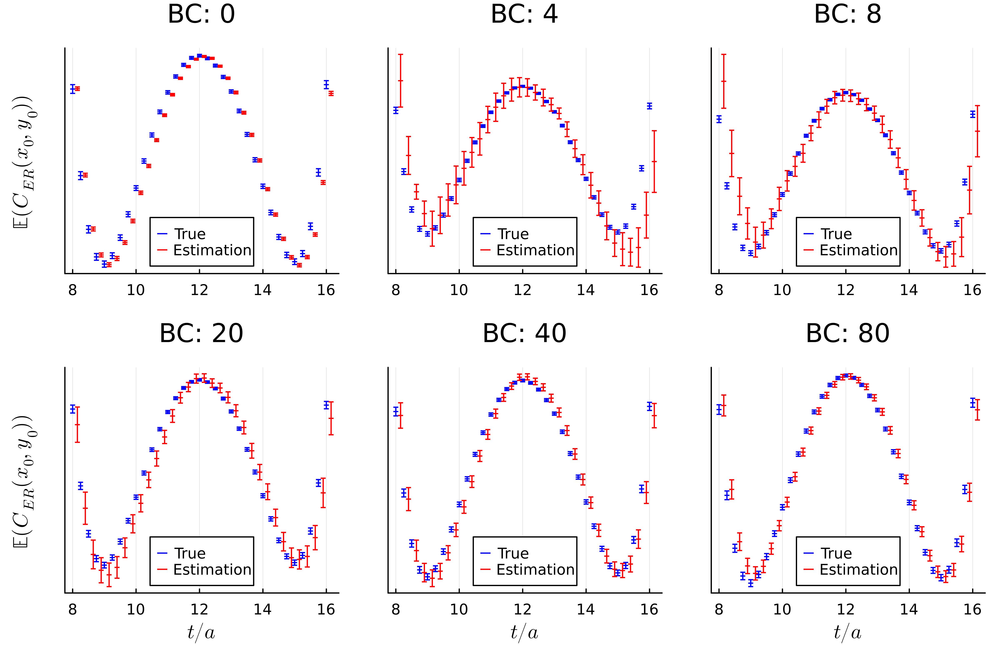

In [175]:
apply_bias_correction("")